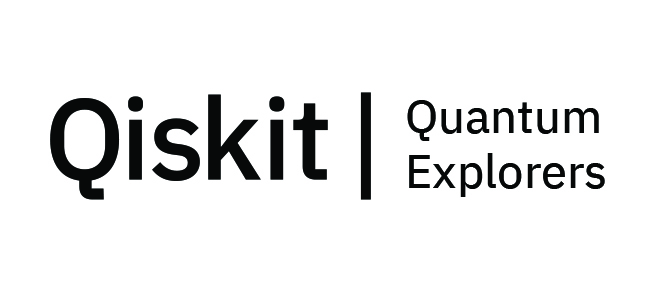

# Introduction to Classical and Quantum Machine Learning
Welcome to Qiskit! 

This lab puts into practice the machine learning techniques you've learned about. You will code up classical machine learning models such as K Nearest Neighbours and Linear Regression to train the well known MNIST and Diabetes datasets. You will then code quantum machine learning models such as the Quantum Support Vector Machine and Quantum Variational Classifier to train the Iris and Wine datasets.

Before starting with the exercises, please run the cell below by pressing 'shift' + 'return'.
If there are any packages that you need to install, you can do so with the command:
```!pip install <PACKAGE NAME>``` 
in Jupyter notebook. Please note that qiskit machine learning is a separate package from qiskit.

In [1]:
import numpy as np
import pandas as pd

# Importing classical ML libraries
from sklearn import datasets
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, mean_squared_error
from sklearn.linear_model import LinearRegression, LogisticRegression

# Importing standard Qiskit libraries
from qiskit import BasicAer
from qiskit.algorithms.optimizers import COBYLA, SPSA
from qiskit.circuit.library import RealAmplitudes, TwoLocal, ZFeatureMap, ZZFeatureMap
from qiskit_machine_learning.algorithms import QSVC, VQC
from qiskit_machine_learning.algorithms.classifiers.pegasos_qsvc import PegasosQSVC
from qiskit_machine_learning.kernels import QuantumKernel
from qiskit_machine_learning.utils.loss_functions import CrossEntropyLoss
from qiskit.utils import QuantumInstance, algorithm_globals

## I.1: Introduction to Classical Classification Techniques using the MNIST Dataset

The [MNIST dataset](http://yann.lecun.com/exdb/mnist/) is a very famous dataset used for machine learning exercises. It is comprised of 1000 preprocessed 8x8 arrays of grayscale values of images of handwritten numbers. It can be thought of the 'hello world' for machine learning.

In this exercise we will be using the classical machine learning (ML) technique, K Nearest Neighbours (KNN), to correctly classify samples of input handwritten numbers as their correct value. This exercise will serve as an introduction to how to code up an ML model before diving into quantum ML models.

<img src="https://upload.wikimedia.org/wikipedia/commons/2/27/MnistExamples.png">

MNIST Sample Images


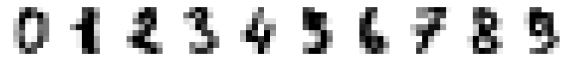

In [2]:
# loading the MNIST dataset from the sklearn package
digits = datasets.load_digits()

print('MNIST Sample Images')

# converting the 8x8 array of a number to an image
_, axes = plt.subplots(nrows=1, ncols=10, figsize=(10, 3))
for ax, image, label in zip(axes, digits.images, digits.target):
    ax.set_axis_off()
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation="nearest")

In [3]:
# Here, we assign our data (the arrays representing the handwritten numbers) to the X variable
# and assign the class labels (the number value) to the y variable
X = digits.data 
y = digits.target

# Splitting our data: 75% being used for training and 25% being used for testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

### 1.) Complete the KNN code to perform the training and prediction for the MNIST dataset
Play around with different values of n_neighbours (the k value) to see what value for k will result in the greatest accuracy

In [4]:
def lab1_ex1(class_num=2):
    k = class_num ## FILL IN YOUR CODE HERE
    model = KNeighborsClassifier(n_neighbors= k)
    
    model.fit(X_train, y_train) ## FILL IN YOUR CODE HERE
    pred = model.predict(X_test) ## FILL IN YOUR CODE HERE
    
    return k, pred

for class_num in range(2, 10+1):
    k, pred = lab1_ex1(class_num)
    acc = accuracy_score(y_test, pred)
    print(f'K = {k}; Accuracy: {acc}')

K = 2; Accuracy: 0.9844444444444445
K = 3; Accuracy: 0.9866666666666667
K = 4; Accuracy: 0.9866666666666667
K = 5; Accuracy: 0.9933333333333333
K = 6; Accuracy: 0.9955555555555555
K = 7; Accuracy: 0.9933333333333333
K = 8; Accuracy: 0.9888888888888889
K = 9; Accuracy: 0.9866666666666667
K = 10; Accuracy: 0.9866666666666667


In [5]:
model = KNeighborsClassifier(n_neighbors=10)
model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=10)

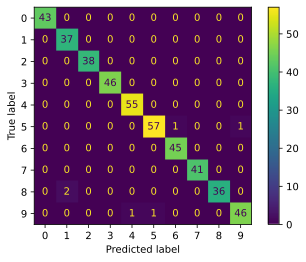

In [6]:
cm = confusion_matrix(y_test, pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=model.classes_)
disp.plot()
plt.show()

## I.2: Introduction to Classical Regression Techniques using the Diabetes Dataset

The [diabetes dataset](https://www4.stat.ncsu.edu/%7Eboos/var.select/diabetes.tab.txt) contains 442 patient records with ten baseline variables: age, sex, body mass index, average blood pressure, and six blood serum measurements. All ten features are continuous data measures and pose a natural use case for regression techniques. 

In this section, we will be exploring various forms of regression techniques. Regression is a form of statistics that aims to determine the strength of a relationship between one dependent variable and a set of other independent variables. 

In [7]:
diabetes = datasets.load_diabetes(as_frame=True)
X_diabetes = diabetes.data
y_diabetes = diabetes.target
X_diabetes.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204
2,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641


In [8]:
import seaborn as sns

df_data = pd.DataFrame(data=diabetes.data, columns=diabetes.feature_names)
df_target = pd.DataFrame(data=diabetes.target)
#df.head()
df = pd.concat([df_data, df_target], axis=1)

sns.pairplot(df, hue='sex')
plt.show()

### 2.) Complete the logistic regression code to perform the training and prediction for the diabetes dataset
Now that you have seen how to create a model using sci-kit learn in the previous exercise, have a go at following the same method of splitting the data into training and testing, fitting the model and predicting the testing subset. 

Using some of the techniques mentioned in the introductory lecture, as well as some others you may have seen, determine what the best type of regression technique would be to use for this particular data set.

There are also a number of different machine learning techniques that can be utilised to increase the accuracy of the model even further! If you are up for the challenge, try exploring the methods of cross validation, hyperparameter tuning or feature selection.

In [9]:
diabetes = datasets.load_diabetes()
X_diabetes = diabetes.data # FILL IN YOUR CODE HERE
y_diabetes = diabetes.target # FILL IN YOUR CODE HERE

In [10]:
def lab1_ex2(X_diabetes, y_diabetes, normal=False):
    ##
    X_train, X_test, y_train, y_test = train_test_split(X_diabetes, y_diabetes, test_size=0.25, random_state=42)    
    ## 
    ## FILL IN YOUR CODE HERE
    ##
    model = LinearRegression()
    X_train = X_train[:, [1,2,7,8]]
    X_test = X_test[:, [1,2,7,8]]

    if normal:
        X_means = np.array([np.mean(X_train[:, i]) for i in range(X_train.shape[1])])
        X_stds = np.array([np.std(X_train[:, i]) for i in range(X_train.shape[1])])
        y_mean = np.mean(y_train)
        y_std = np.std(y_train)
        X_train = (X_train - X_means) / X_stds
        y_train = (y_train - y_mean) / y_std
    model.fit(X_train, y_train)

    if normal:
        X_test = (X_test - X_means) / X_stds
        return y_test, model.predict(X_test) * y_std + y_mean
    else:
        return y_test, model.predict(X_test)

In [11]:
y_test, predictions_diabetes = lab1_ex2(X_diabetes, y_diabetes)

In [12]:
print(f'R2 score: {r2_score(y_test, predictions_diabetes)}')
print(f'Mean squared error: {mean_squared_error(y_test, predictions_diabetes)}')

R2 score: 0.5170564443502303
Mean squared error: 2670.5280526409865


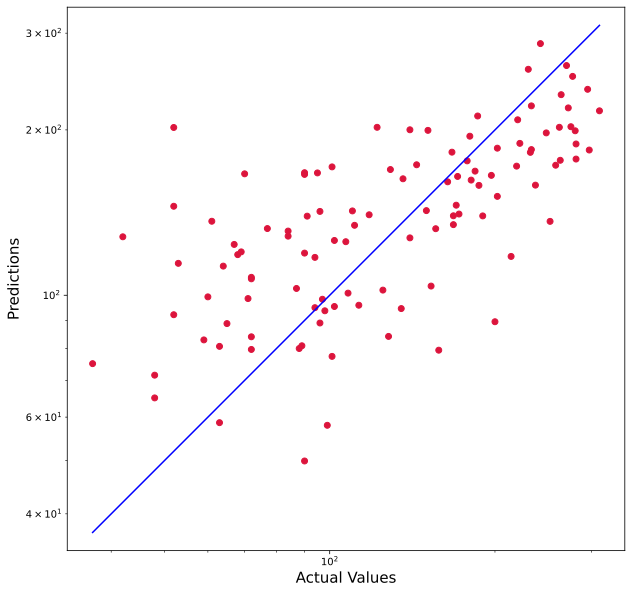

In [13]:
plt.figure(figsize=(10,10))
plt.scatter(y_test, predictions_diabetes, c='crimson')
plt.yscale('log')
plt.xscale('log')

p1 = max(max(predictions_diabetes), max(y_test))
p2 = min(min(predictions_diabetes), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.axis('equal')
plt.show()

## I.3: Introduction to Quantum Support Vector Machines through the Iris Dataset

Now let's jump into some hands on quantum machine learning problems. We will first be looking at the quantum support vector machines which you would have learnt about [here](https://learn.qiskit.org/course/machine-learning/quantum-feature-maps-kernels#quantum-16-0) in the Qiskit textbook.

The [Iris dataset](https://archive.ics.uci.edu/ml/datasets/iris) contains three classes - different species of the iris flower, and four attributes - sepal length, sepal width, petal length and petal width.
As the Iris dataset contains three classes, but both classical and quantum SVM techniques are optimal for just two classes, only two of the three classes will be used in this example as the support vector machine class only supports two dimensions.

### 3.) Complete the QSVC code below to classify the iris data into the correct classes

In [14]:
iris = datasets.load_iris()
X = iris.data[:, :2]
y = iris.target

train_features, test_features, train_labels, test_labels = train_test_split(X, y, train_size=0.25, shuffle=True)

In [16]:
# number of qubits is equal to the number of features
num_qubits = 2

# number of steps performed during the training procedure
tau = 100

# regularization parameter
C = 1000

algorithm_globals.random_seed = 12345

In [17]:
backend = QuantumInstance(
    BasicAer.get_backend("statevector_simulator"),
    seed_simulator=algorithm_globals.random_seed,
    seed_transpiler=algorithm_globals.random_seed,
)

# https://learn.qiskit.org/course/machine-learning/quantum-feature-maps-kernels#quantum-16-0
# https://github.com/Qiskit/platypus/blob/main/notebooks/summer-school/2021/resources/lab-notebooks/lab-3.ipynb
# https://qiskit.org/documentation/machine-learning/tutorials/03_quantum_kernel.html
def lab1_ex1():
    #
    # FILL IN THE MISSING PARAMETERS
    feature_map = ZFeatureMap(feature_dimension=num_qubits, reps=2)
    qkernel = QuantumKernel(feature_map=feature_map, quantum_instance=backend)
    # XXX: C and num_steps are valid only for PegasosQSVC? but only binary classification is supported by PegasosQSVC
    qsvc = QSVC(quantum_kernel=qkernel)
    #qsvc = PegasosQSVC(quantum_kernel=qkernel, C=C, num_steps=tau)
    #
    #
    return qsvc

qsvc = lab1_ex1()

# training
qsvc.fit(train_features, train_labels)

# testing
qsvc_score = qsvc.score(test_features, test_labels)
print(f"QSVC classification test score: {qsvc_score}")

QSVC classification test score: 0.5752212389380531


As you can see there are a number of different parameters that can be changed in this model, such as the feature map, the 
Have a go at changing these parameters to see if you can improve your score. Feel free to share your highest test score on the #q-machine-learning channel


## I.4: Introduction to Variational Quantum Classifiers using the Wine Dataset
The Variational Quantum Classifier (VQC) is a special variant of the NeuralNetworkClassifier with a CircuitQNN. It applies a parity mapping (or extensions to multiple classes) to map from the bitstring to the classification, which results in a probability vector, which is interpreted as a one-hot encoded result. By default, it applies this the CrossEntropyLoss function that expects labels given in one-hot encoded format and will return predictions in that format too [[1]](https://qiskit.org/documentation/machine-learning/tutorials/02_neural_network_classifier_and_regressor.html).

In this section, we will be using the [wine dataset](https://archive.ics.uci.edu/ml/datasets/wine) which contains the chemical analysis of wines grown in the same region in Italy but derived from three different cultivars. The analysis determined the quantities of 13 constituents found in each of the three types of wines. This is again a classification problem. 

In [18]:
wine_data = datasets.load_wine()
X_wine = wine_data.data[:-48]
y_wine = wine_data.target[:-48]

training_features_wine, test_features_wine, training_labels_wine, test_labels_wine = \
    train_test_split(X_wine, y_wine, train_size=100, shuffle=True)

# one hot encoding the training labels
b = np.zeros((training_labels_wine.size, training_labels_wine.max() + 1))
b[np.arange(training_labels_wine.size), training_labels_wine] = 1
training_labels_wine = b

# one hot encoding the testing labels
c = np.zeros((test_labels_wine.size, test_labels_wine.max() + 1))
c[np.arange(test_labels_wine.size), test_labels_wine] = 1
test_labels_wine = c

In [29]:
df_data = pd.DataFrame(data=X_wine)
sns.pairplot(df_data)
plt.show()

### 4.) Complete the code below to classify the wine dataset using VQC methods
Now you have had some experience with classical and quantum machine learning models, have a go at completing the below VQC model on the wine dataset. Make sure you preprocess your data to be the correct input format for the model, and play around with parameters such as the feature map and ansatz to obtain your highest accuracy score! As the feature dimensions of the wine dataset is 13, this model may take a while to run. If your Jupyter notebook kernel dies, just restart the kernel and try again, it may just be due to the large amount of data processing (you can also reduce the number of training and testing points). If your code is incorrect, it may cause the kernel to crash as well.

In [30]:
feature_dim=13
seed=42

def lab1_ex4():
    # 
    # FILL IN YOUR CODE HERE
    feature_map = ZZFeatureMap(feature_dimension=feature_dim, reps=2)
    ansatz = TwoLocal(feature_dim, ['ry', 'rz'], 'cz', reps=3)
    backend = BasicAer.get_backend('qasm_simulator')
    quantum_instance = QuantumInstance(backend, shots=1024, seed_simulator=seed, seed_transpiler=seed)
    vqc = VQC(feature_map=feature_map,
              ansatz=ansatz,
              optimizer=COBYLA(maxiter=100),
              quantum_instance=quantum_instance
              )
    #
    #
    return vqc

vqc = lab1_ex4()

vqc.fit(training_features_wine, training_labels_wine)

score = vqc.score(test_features_wine, test_labels_wine)
print(f"Testing accuracy: {score:0.2f}")

KeyboardInterrupt: 